# 🚀 **Fire Signal Detection with YOLOv8** 🔥

In recent years, Brazil has faced critical challenges related to **deforestation** and **forest fires**, mainly in the **Amazon Forest**, one of the largest biomes in the world. The destruction caused by illegal fires not only threatens biodiversity, but also contributes significantly to greenhouse gas emissions, worsening climate change. Historically, the increase in fires occurs due to unsustainable agricultural practices, illegal logging and the disorderly expansion of agricultural frontiers. According to data from INPE (National Institute for Space Research), the number of fires in the Amazon has reached alarming levels in recent years.

In this context, there is a need for technologies that can **monitor and quickly identify fire outbreaks**, contributing to more effective control actions and minimizing environmental and socioeconomic damage.

### **The Project**
This project uses **computer vision** and the powerful **YOLO (You Only Look Once)** architecture to develop a system capable of **detecting signs of fire from a certain distance**. The proposal aims to demonstrate how **data and artificial intelligence** can play a crucial role in **environmental monitoring** and **prevention of natural disasters**.

### **Objective**
The main objective is to create an AI-based solution that facilitates the **rapid identification of forest fires**, contributing to **environmental preservation** and supporting public policies and conservation initiatives. 🌱💻


In [ ]:
# Importing the necessary libraries:

#Computer vision
from ultralytics import YOLO
import torchvision.transforms as transforms
import torchvision.transforms.functional as F
import albumentations as A

#Image processing:
from PIL import Image, ImageDraw
import cv2

# Data Manipulation
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from collections import Counter

# Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns

#File Handling
import os
import shutil
from dotenv import load_dotenv

#Numerical Operations and Statistics
import numpy as np
import random

#DeepLearning
import torch

In [ ]:
# Load variables from .env file
load_dotenv()

True

To explore and process the `D-fire` dataset, a custom class was created that facilitates data loading and management, in addition to preparing images and labels for training the YOLOv8 model. This dataset will be able to:<p> 

- Organizes images and labels, automatically associating them.<p>

- Translates YOLO coordinates to absolute bounding boxes, ensuring integrity and consistency.<p>

- Applies synchronized transformations to images and bounding boxes, increasing the robustness of the model.<p>

In [ ]:
class CustomDataset(Dataset):
    def __init__(self, root_dir, dataset_type='train', transform=None):
        self.root_dir = root_dir
        self.transform = transform

        # Define image and label directories
        if dataset_type == 'train':
            image_dir = os.path.join(root_dir, 'train/images')
            label_dir = os.path.join(root_dir, 'train/labels')
        elif dataset_type == 'test':
            image_dir = os.path.join(root_dir, 'test/images')
            label_dir = os.path.join(root_dir, 'test/labels')
        elif dataset_type =='train_new':
            image_dir = os.path.join(root_dir, 'images')
            label_dir = os.path.join(root_dir, 'labels')
        elif dataset_type =='test_new':
            image_dir = os.path.join(root_dir, 'images')
            label_dir = os.path.join(root_dir, 'labels')    

        else:
            raise ValueError("dataset_type deve ser 'train' ou 'test'.")

       # Associate images with labels
        self.image_to_label_map = {
            os.path.join(image_dir, f): os.path.join(label_dir, f.replace('.jpg', '.txt'))
            for f in os.listdir(image_dir) if f.endswith('.jpg')
        }

        # Get only images that have labels
        self.image_paths = list(self.image_to_label_map.keys())

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label_path = self.image_to_label_map[img_path]

       # Upload image
        image = Image.open(img_path).convert('RGB')
        image = np.array(image)  # Convert to numpy array, needed for Albumentations

        # Read image dimensions
        img_height, img_width = image.shape[:2]

       # Read the bounding boxes of the YOLO .txt file
        boxes = []
        labels = []
        with open(label_path, 'r') as f:
            for line in f:
                class_id, x_center, y_center, width, height = map(float, line.strip().split())
                
                # Correct the bounding box coordinate to ensure valid values
                xmin = (x_center - width / 2) * img_width
                ymin = (y_center - height / 2) * img_height
                xmax = (x_center + width / 2) * img_width
                ymax = (y_center + height / 2) * img_height

                # Ensure that xmin < xmax and ymin < ymax
                if xmax <= xmin or ymax <= ymin:
                    continue  # Ignore invalid boxes

                # Ensure coordinates are within image boundaries
                xmin = max(0, xmin)
                ymin = max(0, ymin)
                xmax = min(img_width, xmax)
                ymax = min(img_height, ymax)

                boxes.append([xmin, ymin, xmax, ymax])
                labels.append(int(class_id))  # Class as integer

        # If there are no valid boxes, set an empty box
        if len(boxes) == 0:
            boxes = torch.zeros((0, 4), dtype=torch.float32)  # Empty tensor to indicate absence of boxes
            labels = torch.zeros((0,), dtype=torch.int64)
        else:
            boxes = torch.tensor(boxes, dtype=torch.float32)
            labels = torch.tensor(labels, dtype=torch.int64)

        # Apply Albumentations transformations
        if self.transform:
            transformed = self.transform(image=image, bboxes=boxes.tolist(), labels=labels.tolist())
            image = transformed['image']
            boxes = torch.tensor(transformed['bboxes'], dtype=torch.float32)
            labels = torch.tensor(transformed['labels'], dtype=torch.int64)

        # Target configuration
        target = {
            'boxes': boxes,
            'labels': labels,
            'image_id': torch.tensor([idx]),
            'area': (boxes[:, 2] - boxes[:, 0]) * (boxes[:, 3] - boxes[:, 1]) if boxes.numel() > 0 else torch.tensor([]),
            'iscrowd': torch.zeros((len(boxes),), dtype=torch.int64)
        }

        return image, target


With the `CustomDataset` class implemented, two additional functions were created to streamline working with the dataset: one for visualizing images with bounding boxes and another for grouping samples into batches.

In [ ]:
# Function to view image with bounding boxes
def plot_image_with_boxes(image, target):
    image = transforms.functional.to_pil_image(image)
    draw = ImageDraw.Draw(image)
    for box in target['boxes']:
        draw.rectangle(((box[0], box[1]), (box[2], box[3])), outline="red", width=2)
    plt.imshow(image)
    plt.axis('off')
    plt.show()

# Function to group samples
def collate_fn(batch):
    images = []
    targets = []
    for b in batch:
        images.append(b[0])
        targets.append(b[1])
    return images, targets

In [ ]:
# Instantiating the Training and Test datasets
train_dataset = CustomDataset(root_dir=os.getenv("DATASET_PATH"), dataset_type='train')

test_dataset = CustomDataset(root_dir=os.getenv("DATASET_PATH"), dataset_type='test')

## **Exploratory Data Analysis (EDA)**<p>

In this section, an Exploratory Data Analysis (EDA) will be carried out with the aim of understanding the main characteristics of the dataset used in this project. EDA is a key step in gaining insights and guiding decisions about data preprocessing and modeling. During the analysis, the following aspects will be investigated:<p>

- Total Number of Images in Each Dataset: Verification of the number of images available in the training, validation and test sets.<p>

- Number of Labeled and Unlabeled Images: Identification of the proportion of images that have annotations (bounding boxes) compared to those that do not.<p>

- Distribution between Classes: Analysis of the frequency of each class present in the dataset to understand how the data is organized.<p>

- Dataset Imbalance Check: Assessment of the existence of imbalances in the classes, which can influence the model's performance.<p>

- Analysis of Bounding Box Dimensions: Investigation of the dimensions of bounding boxes, such as height and width, to understand variations and identify possible anomalies.<p>

Esse tipo de análise permitirá identificar problemas como desbalanceamento, imagens sem rótulos e inconsistências nas anotações, que podem impactar o treinamento e a performance do modelo.<p>

To check the number of images available in the datasets, the function `count_images_per_dataset` was created, which receives the training and test datasets as parameters. This function uses the `__len__` method of the custom class `CustomDataset`, which returns the total number of images in each dataset. The purpose of this check is to ensure that the number of images matches expectations and that there are no inconsistencies or data loading issues. Image counting is an essential step in the exploratory analysis process, as it helps plan model training and validation, considering the appropriate size of each set.

In [282]:
def count_images_per_dataset(train_dataset, test_dataset):
    print(f"Total images in the training set: {len(train_dataset)}")
    print(f"Total images in the test set: {len(test_dataset)}")

count_images_per_dataset(train_dataset, test_dataset)

Total images in the training set: 17340
Total images in the test set: 3876


After executing the function, it was identified that:<p>

The numbers indicate that the training set has the largest proportion of data, which is ideal for ensuring that the model learns robustly. The test set, although smaller, seems adequate to evaluate the generalization of the model.

This initial count also provides a basis for analyzing potential imbalances or issues in the data that could impact model performance during training and validation.

For the next stage of the exploratory analysis, the number of images with and without bounding box descriptions will be evaluated in both training and testing data sets. For this, the function `count_images_with_labels` was developed, which goes through all the images in the dataset and checks whether each one has at least one associated bounding box. This analysis allows you to understand the quality of the annotated data, identify possible problems in the labeling process and determine the quantity of images directly usable for training and validating the model. A high percentage of images without labels may indicate:

- The need to clean or delete these images.

- The possibility of performing additional annotations to improve model performance.

In [283]:
def count_images_with_labels(dataset):
    total_images = len(dataset)
    images_with_labels = 0
    images_without_labels = 0

    for idx in range(total_images):
        _, target = dataset[idx]
        if len(target['boxes']) > 0:
            images_with_labels += 1
        else:
            images_without_labels += 1

    print(f"Images with labels: {images_with_labels}")
    print(f"Images without labels: {images_without_labels}")
    print(f"Percentage without labels: {images_without_labels / total_images * 100:.2f}%")

# Para treino
print("Training Set:")
count_images_with_labels(train_dataset)

# Para teste
print("\nTest Set:")
count_images_with_labels(test_dataset)


Training Set:
Images with labels: 9507
Images without labels: 7833
Percentage without labels: 45.17%

Test Set:
Images with labels: 2067
Images without labels: 1809
Percentage without labels: 46.67%


The numbers resulting from the execution of the function show that approximately 45% of the images in the training set and 46% in the test set do not have bounding boxes associated. This may occur due to:<p>

- Absence of objects in the scene (scenarios where no fire or sign of fire was detected).<p>
- Problems with annotation during dataset construction.<p>

This allows you to define future actions to train the model:<p>

**Images without labels:**<P>

- Decide whether they will be removed or kept in the pipeline, depending on the model approach.<p>
- Images without labels can be useful for training the model to recognize "neutral" images (without fires), contributing to a lower false positive rate.<P>

**Images with labels:**<p>

- Investigate the quality of existing annotations and ensure that the bounding boxes are correct and aligned with the expected objects

**Class Distribution Analysis:**<p>

Class distribution analysis is an essential step to understand the proportion of different types of objects annotated in the dataset. This investigation allows us to identify possible imbalances between classes, which can impact model performance, especially in tasks such as fire detection, where unbalanced classes can lead to a bias in the prediction.<p>

The objective of this analysis is to calculate the frequency of each class present on the labels and visualize it through a bar graph, facilitating the analysis and identification of potential unbalance problems.<p>

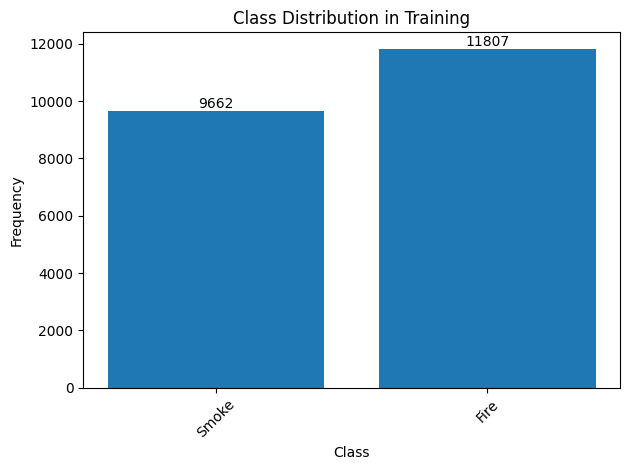

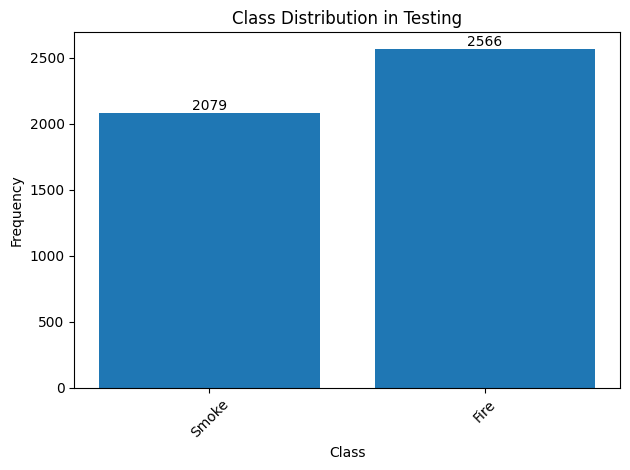

In [ ]:
# Function to count class frequencies
def plot_class_distribution(dataset, dataset_type):
    class_counts = Counter()
    
    for _, target in dataset:
        class_counts.update(target['labels'].tolist())

    # Assuming you have a class mapping (if not, replace with the list of classes)
    class_names = {
        0: 'Smoke', # Mapping example
        1: 'Fire',
        # Add more classes as needed
    }

    # Updating keys with class names
    class_labels = [class_names.get(label, str(label)) for label in class_counts.keys()]

   # Plotting the graph
    fig, ax = plt.subplots()
    bars = ax.bar(class_labels, class_counts.values())

    # Adding the values ​​to the top of each column
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height, str(int(height)), ha='center', va='bottom')

    # Adjustments to the graph
    plt.xlabel('Class')
    plt.ylabel('Frequency')
    plt.title(f'Class Distribution in {dataset_type.capitalize()}')
    plt.xticks(rotation=45)  # To ensure that labels do not overlap
    plt.tight_layout()  # Adjust layout to avoid overlapping

    # Displaying the graph
    plt.show()

# Count and color for practice set
plot_class_distribution(train_dataset, "Training")

# Count and plot for the test set
plot_class_distribution(test_dataset, "Testing")


The graphs above clearly show the frequency of each class in both data sets. Including exact values ​​above the bars provides greater clarity for interpretation<p>

**Impact of Imbalance:**<p>

Although the imbalance is not extreme, it may be necessary to use compensation techniques during training, such as:<p>

- Adjustment of loss function weights to balance the influence of each class.<p>
- Increase of the minority class (`Smoke`) with data augmentation techniques.<p>
- Application of undersampling or oversampling.<p>

**Unbalance Proportionality Check**<p>

After identifying a class imbalance in the dataset, the next step will be to check whether this imbalance is proportionally distributed between the training and testing sets. This analysis is important to ensure that the model will be trained and evaluated under consistent conditions, avoiding possible biases during validation.

**Methodology**<p>
1. **Calculation of Proportions:** For each class in the training and testing datasets, the proportion was calculated in relation to the total samples in the set. This metric provides a clearer view of the representativeness of each class, regardless of the absolute size of the sets.<p>

2. **Comparison of Proportions:** The proportions of each class between the two sets were compared. The absolute difference between the proportions was calculated and compared to a defined tolerance value, in this case, 5% (0.05).<p>

3. **Imbalance Classification:** If the difference between the proportions is less than or equal to the tolerance for all classes, the imbalance between the two sets will be considered similar.
Otherwise, it will be reported that the imbalance is different.<P>

In [ ]:
def calculate_class_distribution(dataset):
    # Count class frequencies
    class_counts = Counter()
    for _, target in dataset:
        class_counts.update(target['labels'].tolist())
    
   # Calculate class proportions
    total_samples = sum(class_counts.values())
    class_proportions = {cls: count / total_samples for cls, count in class_counts.items()}
    
    return class_proportions

def check_class_imbalance(train_dataset, test_dataset, tolerance=0.05):
    # Calculate class distributions for training and testing
    train_proportions = calculate_class_distribution(train_dataset)
    test_proportions = calculate_class_distribution(test_dataset)

    # Show header
    print(f"{'Class':<10} {'Proportion in Training':<20} {'Proportion in Test':<20} {'Difference':<20}")
    print("-" * 70)

    imbalance_equal = True
    for cls in train_proportions:
        test_prop = test_proportions.get(cls, 0) # If the class is not in the test set
        train_prop = train_proportions[cls]
        
        # Calculate the difference
        diff = abs(train_prop - test_prop)
        
        # Print numeric values
        print(f"{cls:<10} {train_prop:.4f}             {test_prop:.4f}             {diff:.4f}")
        
        # Check if the difference in proportions is greater than the tolerance
        if diff > tolerance:
            imbalance_equal = False

    # Resultado final
    if imbalance_equal:
        print("\nThe class imbalance is similar between training and testing.")
    else:
        print("\nThe class imbalance is different between training and testing.")

# Call the function to check the imbalance
check_class_imbalance(train_dataset, test_dataset)


Class      Proportion in Training Proportion in Test   Difference          
----------------------------------------------------------------------
0          0.4500             0.4476             0.0025
1          0.5500             0.5524             0.0025

The class imbalance is similar between training and testing.


The following table presents the proportions of classes in the training and testing sets, as well as the differences between them:

| **Class**    | **Proportion in Training** | **Proportion in Test** | **Difference** |
|---------------|------------------------------|-------------------------|---------------|
| 0 (Smoke)     | 0.4500                       | 0.4476                 | 0.0025        |
| 1 (Fire)      | 0.5500                       | 0.5524                 | 0.0025        |

The maximum difference between the proportions of each class was 0.0025, which is significantly lower than the established tolerance of 0.05 (5%).

**Analysis of Bounding Boxes - Distribution of box sizes**<p>

To better understand the behavior of the bounding boxes in the training dataset, we performed a statistical analysis of the widths and heights of the bounding boxes. This analysis aims to identify patterns in box sizes and understand the variability in object dimensions.<p>

The average size and standard deviation for the widths and heights of the boxes were calculated. The calculation was done for each box, extracting the dimensions of each object from the coordinates provided on the labels.

In [286]:
widths = []
heights = []
for _, target in train_dataset:
    if len(target['boxes']) > 0:
        widths.extend((target['boxes'][:, 2] - target['boxes'][:, 0]).tolist())
        heights.extend((target['boxes'][:, 3] - target['boxes'][:, 1]).tolist())

print(f"Medium width: {np.mean(widths):.2f}, Standard deviation: {np.std(widths):.2f}")
print(f"Average height: {np.mean(heights):.2f}, Standard deviation: {np.std(heights):.2f}")


Medium width: 204.10, Standard deviation: 246.33
Average height: 124.81, Standard deviation: 130.17


These values ​​indicate that, on average, the bounding boxes in the training dataset are considerably wider than they are tall, with significant variation between boxes (particularly in relation to widths). The high standard deviation suggests that there is a large diversity in the size of the detected objects. To facilitate the understanding of the distributions of the dimensions of the bounding boxes, a histogram will be generated that shows the frequency of the proportions between height and width of the bounding boxes in the dataset. These proportions were calculated as the ratio between the height and width of each box, as shown in the following graph.

Table with Proportion Statistics:


,count,mean,std,min,25%,50%,75%,max
Proportion (Height/Width),21469.0,0.800365,0.474677,0.038199,0.477401,0.696629,1.0,6.866667


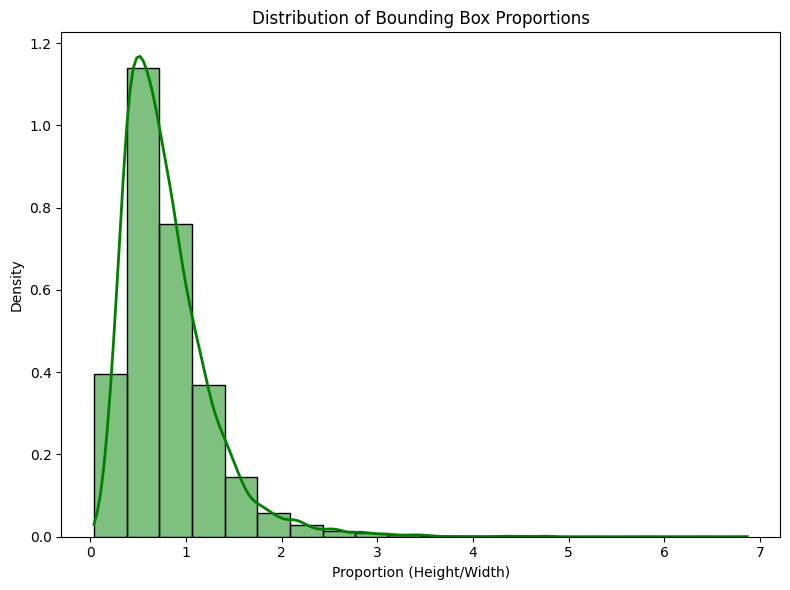

In [ ]:
def plot_bounding_box_proportions(heights, widths):
    # Calculate proportion (Height/Width)
    proportions = [h / w for h, w in zip(heights, widths) if w > 0]
    
    # Generate a numeric table with statistics
    proportions_df = pd.DataFrame(proportions, columns=['Proportion (Height/Width)'])
    
    # Descriptive statistics
    stats = proportions_df.describe().transpose()
    
    # Display the table with statistics
    print("Table with Proportion Statistics:")
    display(stats)
    
    # Chart settings
    plt.figure(figsize=(8, 6))
    
    # Plot the histogram of proportions with the density curve
    sns.histplot(proportions, kde=True, bins=20, color='green', stat='density', line_kws={'color': 'red', 'lw': 2})
    
    # Adjustments to the graph
    plt.xlabel('Proportion (Height/Width)')
    plt.ylabel('Density')
    plt.title('Distribution of Bounding Box Proportions')
    plt.tight_layout()  # Adjust to avoid overlap
    
    # Display the graph
    plt.show()


plot_bounding_box_proportions(heights, widths)


In addition to visually observing the distributions, descriptive statistics of the proportions were also calculated to provide a more detailed view of the data. The table above displays the main metrics of height-to-width ratios. These results indicate that most boxes have aspect ratios close to 1, which suggests that height and width are relatively similar for most objects. The mean of 0.800 and standard deviation of 0.475 reinforce this idea, as most proportions are concentrated around values ​​close to 1.<p>

However, the presence of a maximum value of 6.867 reveals that there are some boxes that are much taller than they are wide, which may indicate objects with vertical orientations or atypical characteristics in relation to the rest. The distribution of proportions in the histogram shows a tendency for more compact boxes to predominate (proportions closer to 1), but also reveals a tail to the right, which represents cases in which the height of the box is significantly greater than its width.<p>

**Implications for the Model:**<p>

This information is crucial when configuring your object detection model, as it can help you define anchors and choose training strategies. The presence of objects with very high proportions may indicate the need for greater diversity in anchors, so that the model is able to better deal with objects in different orientations, a situation that should be evaluated during model training.

**Analysis of Bounding Box Areas**<p>

The analysis of the bounding box areas is essential to understand the size distribution of the objects detected in the dataset. The area of ​​a bounding box is calculated by multiplying its width by its height, and can provide important information about the scale and variation of the objects present. To visualize the distribution of box areas, a histogram with 30 bins was generated, along with a density curve, to observe how the areas are distributed within the data set. The graph generated below shows the distribution of the bounding box areas.

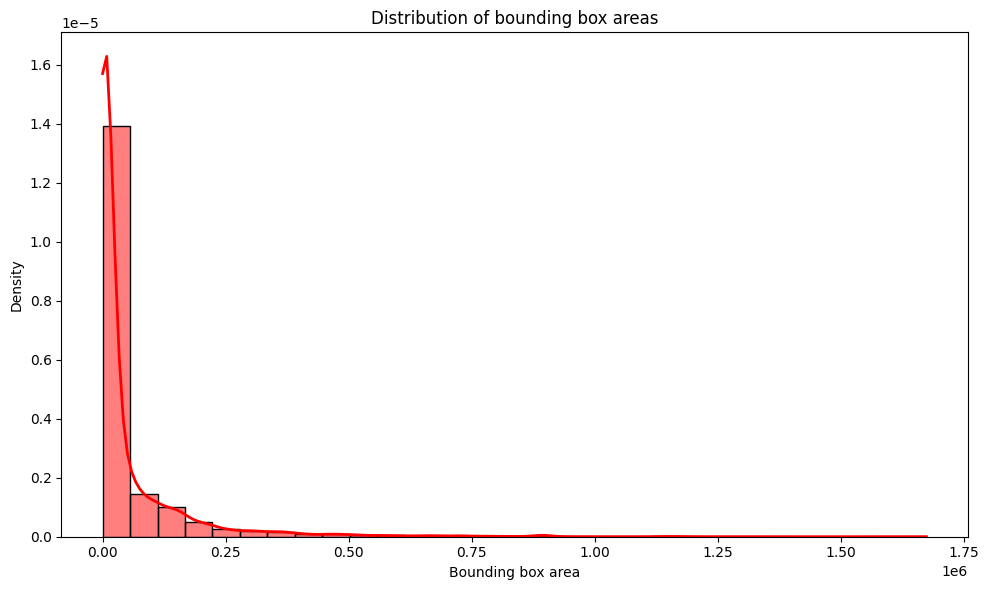

In [ ]:
# Areas being a list of areas of the bounding boxes, as shown in the previous code
areas = [area.item() for _, target in train_dataset for area in target['area']]

# Chart configuration
plt.figure(figsize=(10, 6))

# Plotting the histogram with 30 bins and normalizing the frequencies
sns.histplot(areas, bins=30, kde=True, color='red', stat='density', line_kws={'color': 'red', 'lw': 2})

# Adjusting the labels and title
plt.xlabel('Bounding box area')
plt.ylabel('Density')
plt.title('Distribution of bounding box areas')

# Displaying the graph
plt.tight_layout()
plt.show()

By observing the distribution graph of the *bounding box* areas with the histogram and the density curve, we can draw the following conclusions:<p>

1. **Asymmetrical Distribution**: The distribution of *bounding box* areas presents a significant asymmetry, with a large concentration of very small areas close to zero. The density is highest at low values, which indicates that most of the *bounding boxes* in the dataset are very small.<p>

2. **Long Tail**: The tail of the distribution extends to very large areas, which suggests the presence of some *bounding boxes* that are significantly larger in relation to most others. This may represent objects that occupy large parts of the image or that are on a larger scale compared to more common objects.<p>

3. **Data Concentration**: Most areas are concentrated around very small values, probably representing smaller objects or objects detectable in smaller regions of the image. This may be relevant to the type of objects your detection model is being trained to identify.<P>

**Implications for the Model**<P>

Area analysis is also useful for configuring the object detection model. When there is a large variation in the size of the boxes, as observed, it is important to adjust the model anchors to deal with objects of different scales. This may require the use of multiple anchor scales to improve the model's accuracy in detecting both small and large objects. To explain this idea, let's take a sample example from the training dataset:

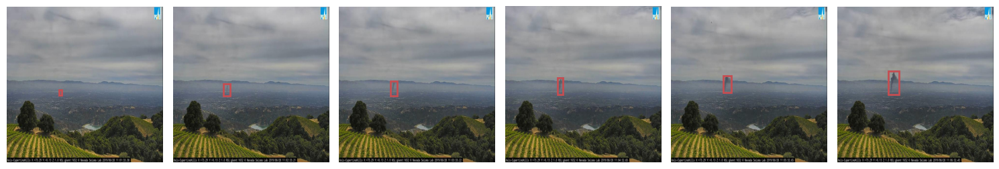

In [ ]:
def plot_multiple_images(dataset, num_images=5):
    """Function to display multiple images side by side"""
    fig, axes = plt.subplots(1, num_images, figsize=(15, 5)) # Create a line with 'num_images' images
    for i in range(num_images):
        image, target = dataset[i]
        ax = axes[i]
        ax.imshow(image)
        for box in target['boxes']:
            x_min, y_min, x_max, y_max = box
            ax.add_patch(plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                      linewidth=2, edgecolor='r', facecolor='none'))
        ax.axis('off')  # Remove axes
    plt.tight_layout()  # Adjust the layout so that images do not overlap
    plt.show()

# Display 6 images side by side
plot_multiple_images(train_dataset, num_images=6)

In the figure above, a sample of multiple frames from a video is shown. It is observed that, as the images progress, the dimensions of the bounding boxes change to make the detections. As smoke identification is part of the nature of our data, these large variations in box dimensions occur due to the need to capture this dynamic phenomenon accurately.

In summary, the analysis of the distribution of the bounding box areas highlights that the model needs to be robust enough to deal with objects of varying sizes. Furthermore, variation in areas can directly influence how the model performs detections. To mitigate these challenges and improve performance, it may be necessary to adopt strategies such as adjusting anchors, which should reflect the specific characteristics of the data, and applying data augmentation techniques to increase sample diversity and balance the distribution of sample sizes. boxes.

**Analysis of Image Sizes and Resolutions**<P>

To understand the diversity of image dimensions in the dataset, an analysis of the heights and widths of all images was performed. Evaluating dimensions is crucial to identify possible inconsistencies or patterns that could impact model training.

In [290]:
heights, widths = [], []
for img_path in train_dataset.image_paths:
    with Image.open(img_path) as img:
        heights.append(img.height)
        widths.append(img.width)

print(f"Average height: {np.mean(heights):.2f}, Medium width: {np.mean(widths):.2f}")
print(f"Minimum height: {np.min(heights)}, Minimum width: {np.min(widths)}")


Average height: 583.28, Medium width: 982.89
Minimum height: 150, Minimum width: 162


When analyzing the results above, a significant variation in image resolutions is observed, especially when considering minimum values. This variation may be associated with different capture conditions, such as the distance from the camera, the quality of the devices used or the varied scenarios present in the videos. These factors reflect the diversity in the forms of capture, highlighting the heterogeneity of the data available in the set.

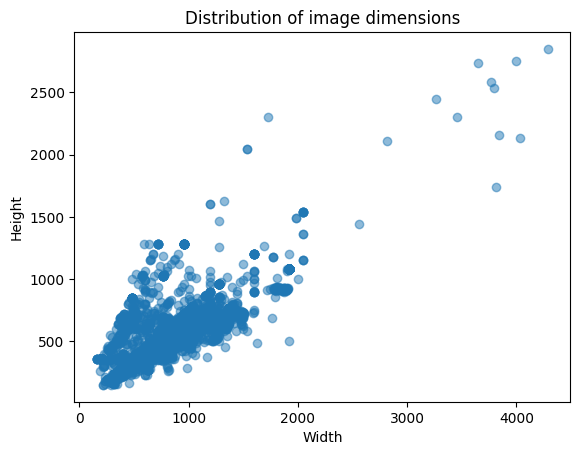

In [291]:
plt.scatter(widths, heights, alpha=0.5)
plt.xlabel('Width')
plt.ylabel('Height')
plt.title('Distribution of image dimensions')
plt.show()


1. **Data Dispersion Analysis<p>**

**High Image Concentration:**<p>

- Most images present specific specifications in a width range between 0 and 1200 pixels and height between 0 and 600 pixels. This suggests that the dataset is predominantly composed of moderate resolution images, many of them with balanced width and height proportions.<p>
- This concentration may be an indication that the images were standardized or follow a specific format, such as rectangular or square proportions more common in the data set.<p>

**Constant Width Image Group (~1200 pixels):**<p>

- Observe a point of greater density around 1200 pixels wide, with variable height. This may indicate that many images have been adjusted or resized to this specific width while maintaining specific height proportions.

2. **Outliers Analysis**<p>

**Images with a width greater than 1200 pixels:**

- Some images are wider than 1200 pixels, being dispersed and isolated. This may indicate examples of high-resolution or panoramic (width greater than height) images capturing large or built-up scenes.<p>
- These outliers can be a result of collecting data from different sources or devices, which develop into variation in dimensions.<p>

**Images with High Height and Restricted Width (Over 800 pixels in height):**

- Some images are taller than 800 pixels and have a smaller width (between 200 and 1000 pixels). This can represent vertical images, such as photos of tall objects (buildings, trees) or images that highlight details in perspective<P>

3. **General Trends in Image Dimensions:**<P>
**Relationship Between Width and Height:**
- In general, there seems to be an increasing trend in height as width increases. In other words, wider images tend to be taller. This is typical of images in horizontal rectangular format (landscape), where the width tends to be greater than the height.<P>

- This relationship can be useful for tuning data preprocessing and model training, as you can consider proportional resizing based on this trend.<P>

**Actions for Model Training:**<p>

**Image Standardization:**<p>
- To ensure the consistency of the model, it may be interesting to pre-process the images so that they all have fixed dimensions, or at least a similar resolution range. This helps ensure that images do not introduce distortions during training.<p>

- Considering that most images are between 0-1200 pixels wide and 0-600 pixels tall, resizing will be necessary to ensure a standard. For example, resizing to 800x600 or 1200x800 pixels.<P>
      
- **Data Augmentation Techniques:**<P>
- As image resolution varies, data augmentation techniques such as cropping, rotation or scaling can be used to generate more varied examples and reduce overfitting.<P>

**Dataset Transformation and Preparation Strategy**<p>

- Based on the characteristics identified in the exploratory analysis, a custom transformation pipeline will be developed to optimize model training. This pipeline will have the following main objectives:

1. Increase and diversify the samples available in the dataset:

- Apply data augmentation techniques to expand the variability of the dataset, making the model more robust to different conditions (such as lighting, orientation and noise) but in this case a restriction will be applied that only images that have notations of bbox will be replicated, the others will only be normalized.<p>

2. **Normalize image dimensions:**

- Standardize dimensions to 640x640 pixels (dimension selected based on image distribution analysis), ensuring compatibility with the YOLO model and optimizing memory usage during training.<p>

Given that we are using the YOLO model via the `Ultralytics` library, we know that directly changing the framework's internal dataset and dataloader functions can be complex and prone to errors. To overcome this limitation, we decided to use a custom dataset and custom dataloader, which will include specific transformations before training. This approach allows us greater control over the applied transformations and facilitates integration with the model.

In [ ]:
def create_dataloader_training(root_dir):
    """
   Function to create the DataLoader for the training dataset with transformations.

    Args:
        root_dir (str): Path to the folder containing the training data.
        batch_size (int): Batch size for the DataLoader.
        num_workers (int): Number of workers for the DataLoader.

    Returns:
        train_dataset (Dataset): training dataset.
    """
    
   # Transformations for the training dataset with bounding boxes adjustment
    transform_train = A.Compose([
        A.Resize(640, 640),
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.5),
        A.HorizontalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
        A.ToGray(p=0.3),  
        A.GaussianBlur(blur_limit=(5, 9), sigma_limit=(0.1, 5), p=0.3),
        A.ISONoise(color_shift=(0.01, 0.05), intensity=(0.1, 0.5), p=0.5),
    ], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

    # Creating the training dataset
    train_dataset = CustomDataset(root_dir=root_dir, dataset_type='train', transform=transform_train)

    return train_dataset

In [ ]:
def create_dataloader_test(root_dir):
    """
   Function to create the DataLoader for the test dataset with transformations.

    Args:
        root_dir (str): Path to the folder containing the test data.
        batch_size (int): Batch size for the DataLoader.
        num_workers (int): Number of workers for the DataLoader.

    Returns:
        test_dataset (Dataset): test dataset.
    """
    
   # Transformation for the test dataset
    transform_test = A.Compose([A.Resize(640, 640)], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

   # Creating the test dataset
    test_dataset = CustomDataset(root_dir=root_dir, dataset_type='test', transform=transform_test)

    return test_dataset


To save the transformations carried out by our dataloader, the `save_transformed_dataset` function will be created with the purpose of saving the transformed images and their labels in YOLO format in an organized directory structure meeting the following requirements: 

- **Facilitate Training and Integration with the Framework:** The `Ultralytics` library requires that datasets be in YOLO format, with images stored in a specific folder and labels in another. This function automates the conversion and storage process, ensuring compatibility with the framework.<p>

- **Preservation of Applied Transformations:** During training, dynamically applied transformations can make data validation and analysis difficult. By saving the transformed images and their labels, you can visually inspect the changes made and better understand the impact of the transformations.<p>

- **Increased Efficiency:** Applying transformations "on-the-fly" during training can be computationally expensive, especially for large datasets. Saving the transformed images and labels allows the model to directly read the ready data, reducing training time.

In [ ]:
# Function to save transformed images and labels cumulatively
def save_transformed_dataset(dataset, output_dir, dataset_type=None):
    """
    Saves transformed images and their labels in a new folder.
    For the training set, it only saves the images with bounding boxes.
    For the test set, it saves all images.
    """
    # Create output directories for images and labels
    images_dir = os.path.join(output_dir, 'images')
    labels_dir = os.path.join(output_dir, 'labels')

   # Clear and recreate output directories if they do not exist
    os.makedirs(images_dir, exist_ok=True)
    os.makedirs(labels_dir, exist_ok=True)

    # Maintain file counter to ensure unique names
    start_idx = len(os.listdir(images_dir))  # To ensure that the index starts from the next available number

    for idx in range(len(dataset)):
       # Get image and labels from the dataset
        image, target = dataset[idx]

        # For the training dataset, only save if there are bounding boxes
        if dataset_type == 'train':
            if len(target['boxes']) > 0:  # Only saves if there are bounding boxes
                # Save transformed image
                image_np = image  # It is already a NumPy array
                image_path = os.path.join(images_dir, f"{start_idx + idx:05d}.jpg")
                cv2.imwrite(image_path, cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR))

                # Save transformed labels in YOLO format
                label_path = os.path.join(labels_dir, f"{start_idx + idx:05d}.txt")
                with open(label_path, 'w') as f:
                    for box, label in zip(target['boxes'], target['labels']):
                        xmin, ymin, xmax, ymax = box
                        x_center = (xmin + xmax) / 2.0 / image_np.shape[1]
                        y_center = (ymin + ymax) / 2.0 / image_np.shape[0]
                        width = (xmax - xmin) / image_np.shape[1]
                        height = (ymax - ymin) / image_np.shape[0]
                        f.write(f"{label} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")
        elif dataset_type == 'test':
            # For the test dataset, save all images regardless of bounding boxes
            image_np = image  # It is already a NumPy array
            image_path = os.path.join(images_dir, f"{start_idx + idx:05d}.jpg")
            cv2.imwrite(image_path, cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR))

            # Save transformed labels in YOLO format (even if there are no boxes)
            label_path = os.path.join(labels_dir, f"{start_idx + idx:05d}.txt")
            with open(label_path, 'w') as f:
                if len(target['boxes']) > 0:
                    for box, label in zip(target['boxes'], target['labels']):
                        xmin, ymin, xmax, ymax = box
                        x_center = (xmin + xmax) / 2.0 / image_np.shape[1]
                        y_center = (ymin + ymax) / 2.0 / image_np.shape[0]
                        width = (xmax - xmin) / image_np.shape[1]
                        height = (ymax - ymin) / image_np.shape[0]
                        f.write(f"{label} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}\n")
                else:
                   # For images without bounding boxes in the test set, we can save an empty file or omit
                    f.write("")

    print(f"Transformed images and labels saved in: {output_dir}")

In [ ]:
# Using the functions:
for element in range(0, 3):
    root_dir =os.getenv("DATASET_PATH")
    train_dataset = create_dataloader_training(root_dir)
    save_transformed_dataset(train_dataset, output_dir=os.getenv("NEW_DATASET_TRAIN_PATH"), dataset_type='train')

Transformed images and labels saved in: C:\Users\eduar\Documents\florest_fire_env\D-Fire\train_transformed
Transformed images and labels saved in: C:\Users\eduar\Documents\florest_fire_env\D-Fire\train_transformed
Transformed images and labels saved in: C:\Users\eduar\Documents\florest_fire_env\D-Fire\train_transformed


In [296]:
# Exemplo de uso
root_dir = os.getenv("DATASET_PATH")
test_dataset = create_dataloader_test(root_dir)
save_transformed_dataset(test_dataset, output_dir=os.getenv("NEW_DATASET_TEST_PATH"),dataset_type='test')

Transformed images and labels saved in: C:\Users\eduar\Documents\florest_fire_env\D-Fire\test_transformed


Finally, to finish preparing the new dataset, we will use the `copy_files` function to move the files from the original folder to the new folder structure that will be consumed by the model during training. This function ensures that data is organized and ready to be used, facilitating the workflow and avoiding possible file location errors.

In [ ]:
def copy_files(source_folder, destination_folder):
    """
    Copies files from a source folder to a destination folder.

    Args:
        source_folder (str): Path of the source folder.
        destination_folder (str): Path of destination folder.
    """
    # Checks if the destination folder exists, otherwise creates it
    if not os.path.exists(destination_folder):
        os.makedirs(destination_folder)
    
    # List all files in the source folder
    for file in os.listdir(source_folder):
        source_path = os.path.join(source_folder, file)
        
        # Check if it is a file (not a folder)
        if os.path.isfile(source_folder):
            destination_path = os.path.join(source_folder, file)
            
           # Copy the file
            shutil.copy2(source_path, destination_path)
            print(f"File {file} copied to {source_folder}")


In [ ]:
# Instantiating the copy functions:
folder_source_images= os.getenv("DATASET_PATH")
folder_destination_images = os.getenv("DESTINATION_IMAGES_FOLDER")
copy_files(folder_source_images, folder_destination_images)

source_folder_labels = os.getenv("SOURCE_FOLDER_LABELS")
destination_folder_labels = os.getenv("DESTINATION_FOLDER_LABELS")
copy_files(source_folder_labels , destination_folder_labels)

Finally, to ensure that the transformations were correctly applied to the dataset, we will extract a sample of the transformed images for visualization. This step is essential to validate whether the modifications, such as resizing, color adjustments and application of bounding boxes, were carried out as expected. To do this, we will use the `show_transformed_images` function, which displays the transformed images together with their drawn bounding boxes.

In [ ]:
# Function to display multiple images after transformations with bounding boxes
def show_transformed_images(dataset, num_images=16):
    
   # Initialize the figure with 4x4 subplots (or other desired arrangement)
    fig, axes = plt.subplots(4, 4, figsize=(12, 12))  # 4x4 to display 16 images
    axes = axes.flatten()  # Flattens the axis array for easier access

    for i in range(num_images):
        # Select a random index
        idx = random.randint(0, len(dataset) - 1)
        
       # Get the image and target
        image, target = dataset[idx]
        
        # Convert the tensor to a PIXEL image for display
        image = F.to_pil_image(image)
        
       # Draw the bounding boxes on the image
        draw = ImageDraw.Draw(image)
        for box in target['boxes']:
            draw.rectangle(((box[0], box[1]), (box[2], box[3])), outline="red", width=2)
        
        # Display the image in the corresponding subplot
        axes[i].imshow(image)
        axes[i].axis('off')  # Remove axes for clean viewing

    plt.tight_layout()  # Adjust the layout so as not to overlap the images
    plt.show()

In [ ]:
# For the training dataset
train_new_dataset = CustomDataset(root_dir=os.getenv("NEW_DATASET_TRAIN_PATH"), dataset_type='train_new')
train_new_loader = DataLoader(train_new_dataset, batch_size=16, shuffle=True, num_workers=0, collate_fn=collate_fn)

test_new_dataset = CustomDataset(root_dir=os.getenv("NEW_DATASET_TEST_PATH"), dataset_type='test_new')
test_new_loader = DataLoader(test_new_dataset, batch_size=16, shuffle=False, num_workers=0, collate_fn=collate_fn)

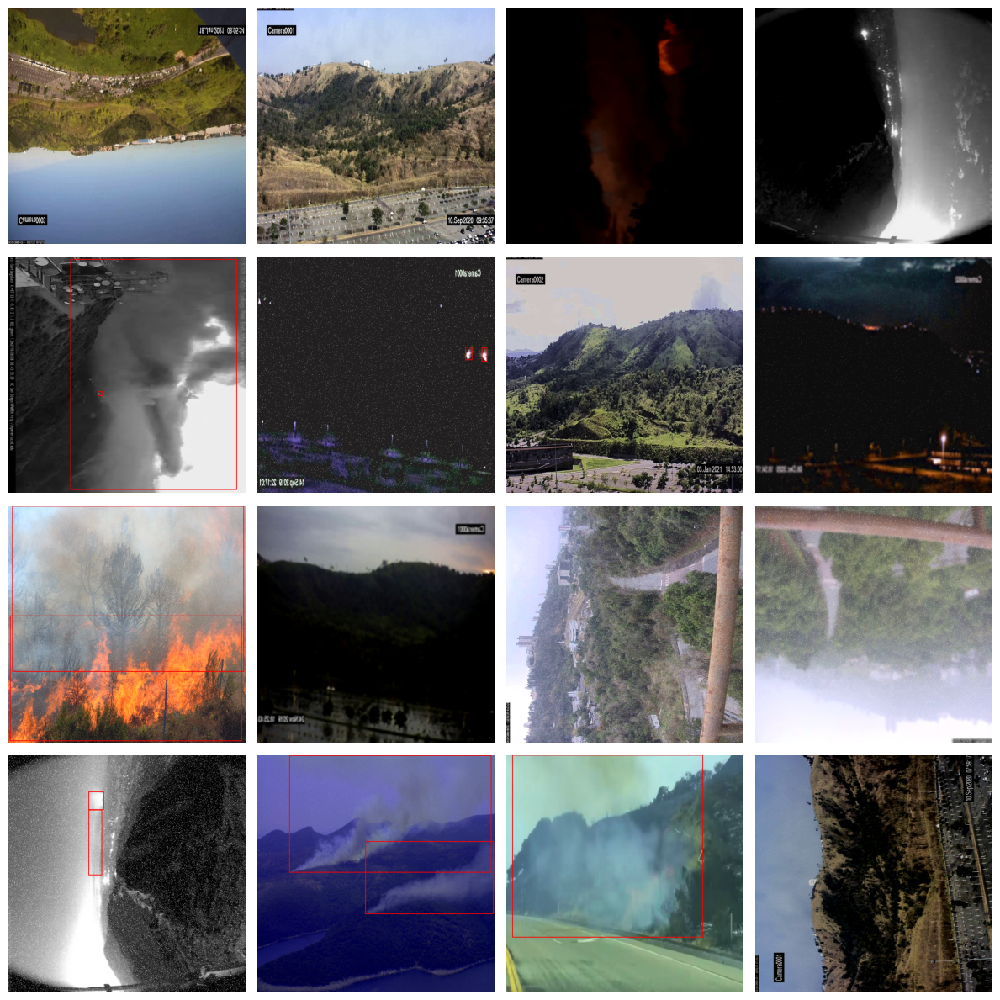

In [ ]:
# Call the function to show 16 images
show_transformed_images(train_dataset)

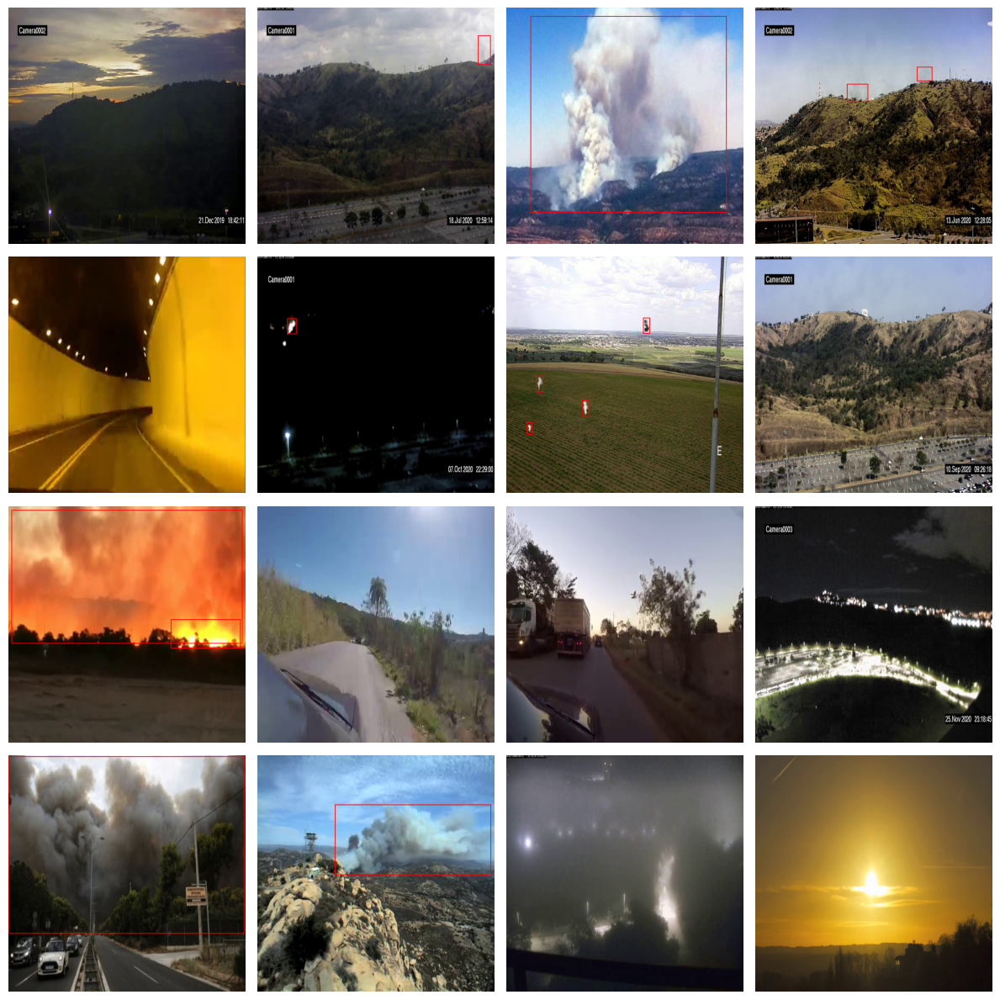

In [ ]:
# Call the function to show 16 images
show_transformed_images(test_dataset)

## **Model Training**<p>

The model chosen for this task was **YOLOv8**, using the Ultralytics framework. For this project, we chose to use the YOLOv8 Small model, which offers an ideal balance between performance and computational efficiency, being suitable for tasks that require speed and good accuracy, even on devices with limited resources.<P>

Key features of YOLOv8 Small include:<p>

- **Optimized layers and architecture:** It is based on a lightweight and efficient structure, with fewer parameters compared to larger models, but maintaining the ability to identify objects with good accuracy.<p>
- **Backbone:** Uses a deep convolutional network for feature extraction, tuned to detect objects of different scales and sizes.<p>

- **Neck:** Includes components such as PANet (Path Aggregation Network), which improve the fusion of features extracted at different layers of the network, allowing better detection of small objects.<p>

- **Head:** Responsible for predicting bounding boxes, classes and confidence scores, implementing anchor or free anchor techniques, depending on the configuration.<p>

To better illustrate how this architecture works, see the following image:<p>

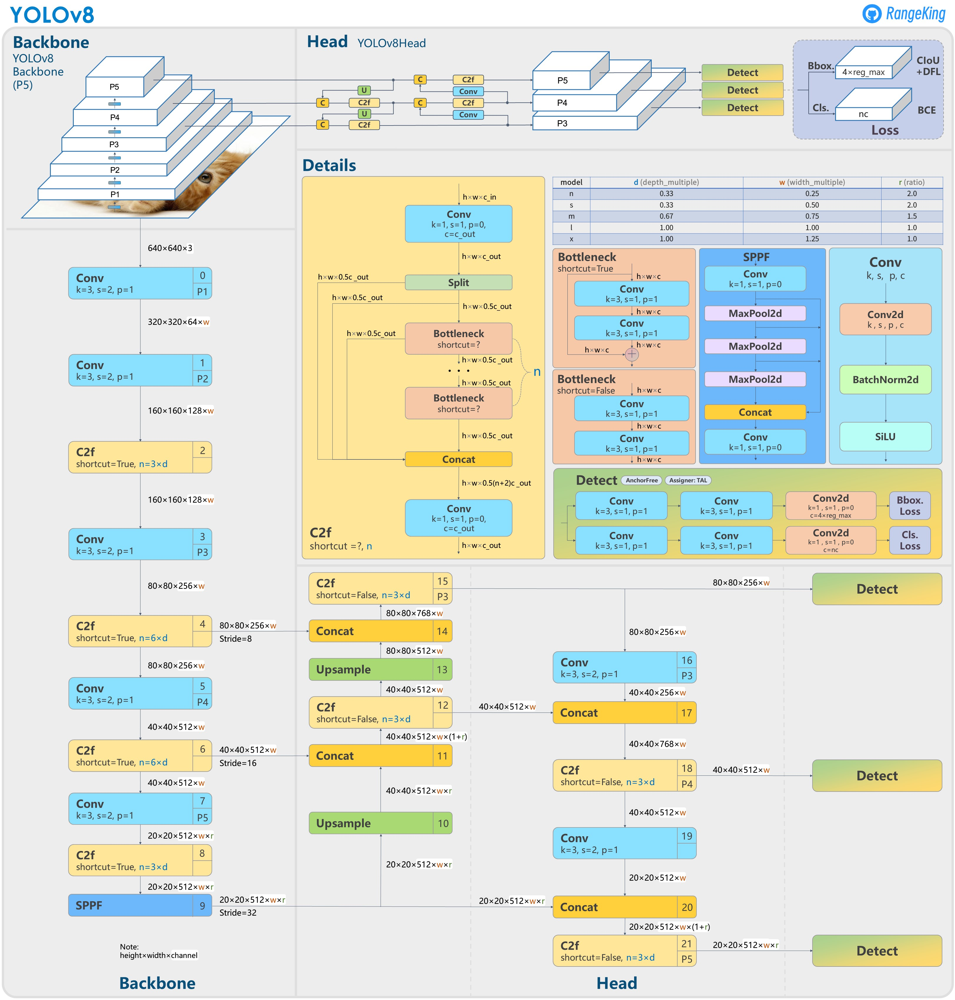

According to the model documentation and article, the main characteristics of this architecture are:<p>

**Mosaic Data Augmentation**<p>
- Similar to YOLOv4, YOLOv8 employs mosaic data augmentation, which combines four images into one during training. This technique provides the model with richer contextual information, improving its ability to generalize. However, YOLOv8 stops applying mosaic augmentation during the final ten training epochs to enhance performance on the validation set, ensuring the model fine-tunes to real-world data distribution.<P>

**Anchor-Free Detection**<p>
- YOLOv8 transitions to anchor-free detection, a significant shift that enhances generalization and simplifies the training process.<P>

- **Limitations of anchor-based detection:** Predefined anchor boxes can hinder learning, especially for custom datasets with unique object scales.<P>

- **Anchor-free advantages:** The model directly predicts the center points of objects, reducing the number of bounding box predictions and accelerating processes like Non-Maximum Suppression (NMS), which eliminates overlapping bounding boxes.<p>

**C2f Module**<p>
- The backbone architecture of YOLOv8 incorporates the C2f module instead of the C3 module used in earlier versions.<p>

- **Key difference:** In the C2f module, outputs from all bottleneck modules are concatenated, unlike the C3 module, which uses only the final bottleneck output.<p>
- **Impact:** This improves gradient flow and accelerates training by enhancing the network’s ability to learn intricate patterns efficiently.<P>
- **Bottleneck modules:** These modules use residual blocks to reduce computational costs in deep learning models without sacrificing performance.<p>

**Decoupled Head**
- YOLOv8 introduces a decoupled head that separates classification and regression tasks, as illustrated in the architecture diagram. Why decouple? Performing these tasks independently improves accuracy by allowing the model to optimize classification and bounding box regression separately.<p>

- **Result:** This design choice leads to better overall performance in object detection tasks.<P>

**Modified Loss Function**

- To handle potential misalignment caused by separating classification and regression, YOLOv8 incorporates a task alignment score. This score helps the model differentiate between positive and negative samples.

- **Task alignment score:** Combines the classification score with the Intersection over Union (IoU) score, quantifying how well a predicted bounding box aligns with the ground truth.

**Loss computation:**<p>

- **Classification loss:** Calculated using Binary Cross-Entropy (BCE), which measures the accuracy of predicted labels.<p>

- **Regression loss:** Combines Complete IoU (CIoU) and Distributional Focal Loss (DFL).<p>

- **CIoU:** Considers center point, aspect ratio, and overlap to improve bounding box predictions.<p>
- **DFL:** Focuses on boundary optimization, prioritizing hard-to-classify false negatives.<p>

These enhancements make YOLOv8 a robust and efficient model, offering superior performance in detecting and classifying objects across diverse datasets.


**Model Training**<p>

In this step, we will train the model and evaluate its performance metrics. We will use the transfer learning technique, in which the first layers of the network will be frozen. This approach aims to preserve the model's ability to identify basic features, such as edges, textures, and shapes, that are common to different types of images. Subsequently, we will train only the final layers of the network, allowing the model to adapt and specialize in the specific characteristics of the dataset used in this task.

In [ ]:
# Load a model
model = YOLO(model='yolov8s.yaml')  # Load custom model

PROJECT = 'florest_fire_env'  # Project name
NAME = 'fire_model'  # Run name

model.train(data='data.yaml', task='detect', epochs=200, verbose=True, batch=20, imgsz=640, patience=20, save=True, device=0,  workers=8,  
    project=PROJECT, name=NAME, cos_lr=True, lr0=0.0001, lrf=0.00001, warmup_epochs=3, warmup_bias_lr=0.000001, optimizer='Adam', seed=42)


New https://pypi.org/project/ultralytics/8.3.38 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.35  Python-3.11.0 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 8188MiB)
engine\trainer: task=detect, mode=train, model=yolov8s.yaml, data=data.yaml, epochs=200, time=None, patience=20, batch=20, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=florest_fire_env, name=fire_model4, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=42, deterministic=True, single_cls=False, rect=False, cos_lr=True, close_mosaic=0, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False,

train: Scanning C:\Users\eduar\Documents\florest_fire_env\D-Fire\train_transformed\labels.cache... 40114 images, 7833 backgrounds, 0 corrupt: 100%|██████████| 40114/40114 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning C:\Users\eduar\Documents\florest_fire_env\D-Fire\test_transformed\labels.cache... 3876 images, 1809 backgrounds, 0 corrupt: 100%|██████████| 3876/3876 [00:00<?, ?it/s]


Plotting labels to florest_fire_env\fire_model4\labels.jpg... 
optimizer: Adam(lr=0.0001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.00046875), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to florest_fire_env\fire_model4
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      4.55G        3.2      3.986       3.83         36        640: 100%|██████████| 2006/2006 [06:59<00:00,  4.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:18<00:00,  5.33it/s]


                   all       3876       4645       0.17      0.184     0.0834     0.0263

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200       4.7G      2.306      2.911      2.675         31        640: 100%|██████████| 2006/2006 [06:46<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:18<00:00,  5.37it/s]


                   all       3876       4645      0.355      0.313       0.25      0.101

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200      4.72G      1.999      2.398      2.237         29        640: 100%|██████████| 2006/2006 [06:41<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.41it/s]


                   all       3876       4645       0.44      0.383      0.348      0.154

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      4.72G      1.875      2.168      2.068         40        640: 100%|██████████| 2006/2006 [06:42<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.42it/s]


                   all       3876       4645      0.477      0.425      0.402       0.19

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200       4.7G      1.788      2.031      1.966         31        640: 100%|██████████| 2006/2006 [06:41<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.49it/s]


                   all       3876       4645      0.512      0.458      0.456      0.218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      4.71G      1.742      1.936      1.903         27        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.50it/s]


                   all       3876       4645      0.538      0.498      0.496      0.244

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      4.71G      1.701      1.862      1.858         33        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.55it/s]


                   all       3876       4645      0.552      0.513      0.516      0.261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      4.73G      1.674      1.799      1.822         54        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.53it/s]


                   all       3876       4645      0.579      0.531      0.554      0.285

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200      4.75G      1.639      1.747      1.786         50        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.54it/s]


                   all       3876       4645      0.612      0.541      0.572      0.298

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200       4.7G       1.62      1.705      1.764         29        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.48it/s]


                   all       3876       4645       0.62      0.552      0.586      0.308

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      4.73G      1.601      1.671      1.743         45        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.51it/s]


                   all       3876       4645      0.629       0.57      0.606      0.324

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      4.71G      1.589      1.641      1.733         39        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.53it/s]


                   all       3876       4645      0.618      0.591      0.612      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      4.71G       1.57      1.606       1.71         29        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.54it/s]


                   all       3876       4645      0.625      0.606      0.635      0.345

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      4.72G      1.555      1.577      1.693         33        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.49it/s]


                   all       3876       4645      0.639      0.603      0.643      0.351

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      4.71G       1.55      1.557      1.686         65        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.48it/s]


                   all       3876       4645       0.65      0.613      0.656      0.361

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      4.64G      1.539       1.54      1.676         27        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.47it/s]


                   all       3876       4645      0.652      0.616      0.658      0.365

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200       4.7G       1.53      1.519      1.665         30        640: 100%|██████████| 2006/2006 [06:41<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.48it/s]


                   all       3876       4645      0.656      0.622      0.664      0.369

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      4.71G      1.515      1.493      1.655         33        640: 100%|██████████| 2006/2006 [06:41<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.49it/s]


                   all       3876       4645      0.655      0.631      0.672      0.376

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200       4.7G       1.51      1.482      1.649         49        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.50it/s]


                   all       3876       4645       0.66      0.631      0.677       0.38

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      4.72G      1.501      1.464      1.639         33        640: 100%|██████████| 2006/2006 [06:41<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.49it/s]


                   all       3876       4645       0.66      0.634      0.679      0.381

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      4.76G      1.489       1.44      1.626         35        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.51it/s]


                   all       3876       4645      0.664      0.633      0.683      0.384

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      4.66G      1.484      1.429      1.619         42        640: 100%|██████████| 2006/2006 [06:42<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.43it/s]


                   all       3876       4645      0.671      0.632      0.687      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      4.72G      1.474      1.417      1.612         62        640: 100%|██████████| 2006/2006 [06:41<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.52it/s]


                   all       3876       4645      0.676      0.631       0.69      0.389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      4.73G      1.471      1.396      1.608         33        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.51it/s]


                   all       3876       4645      0.672      0.637      0.692      0.391

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      4.67G      1.462      1.387      1.598         67        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.54it/s]


                   all       3876       4645      0.674      0.639      0.693      0.393

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200      4.72G       1.46      1.376      1.594         38        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.55it/s]


                   all       3876       4645      0.678      0.635      0.695      0.394

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      4.73G      1.448      1.365      1.584         31        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.55it/s]


                   all       3876       4645      0.683      0.636      0.699      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      4.66G      1.445      1.353      1.578         36        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.52it/s]


                   all       3876       4645      0.683      0.639      0.701      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      4.65G      1.442      1.345      1.578         47        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.56it/s]


                   all       3876       4645      0.682      0.638      0.702      0.399

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      4.74G      1.429      1.329      1.567         44        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.52it/s]


                   all       3876       4645       0.68      0.639      0.702        0.4

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      4.66G      1.425      1.322      1.564         56        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.53it/s]


                   all       3876       4645      0.681       0.64      0.704      0.402

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      4.72G      1.423      1.314      1.558         31        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.55it/s]


                   all       3876       4645      0.682      0.644      0.704      0.403

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      4.75G      1.419      1.301      1.556         41        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.53it/s]


                   all       3876       4645      0.681      0.647      0.706      0.405

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      4.71G      1.411      1.297      1.547         33        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.53it/s]


                   all       3876       4645      0.688      0.649      0.708      0.406

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      4.69G      1.406       1.28      1.542         63        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.53it/s]


                   all       3876       4645      0.689      0.649      0.709      0.407

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      4.71G      1.402      1.273      1.541         27        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.50it/s]


                   all       3876       4645      0.688      0.652      0.712      0.408

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200       4.7G      1.399      1.268      1.537         35        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.54it/s]


                   all       3876       4645      0.681      0.659      0.713      0.409

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      4.72G      1.394      1.262      1.532         46        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.55it/s]


                   all       3876       4645      0.684      0.656      0.714       0.41

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200      4.71G      1.391      1.246      1.526         35        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.54it/s]


                   all       3876       4645      0.683      0.661      0.715      0.411

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200       4.7G      1.384      1.238      1.522         65        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.52it/s]


                   all       3876       4645      0.689      0.659      0.716      0.412

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      4.65G      1.381      1.234      1.519         48        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.53it/s]


                   all       3876       4645      0.693      0.659      0.718      0.413

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200      4.74G      1.376      1.227      1.513         34        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.52it/s]


                   all       3876       4645       0.69      0.663      0.719      0.414

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      4.67G      1.373      1.216      1.511         25        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.56it/s]


                   all       3876       4645      0.693      0.666      0.721      0.415

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200       4.7G      1.373      1.216      1.509         22        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.55it/s]


                   all       3876       4645      0.689       0.67      0.723      0.416

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      4.74G      1.365      1.208      1.504         48        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.56it/s]


                   all       3876       4645      0.692       0.67      0.725      0.417

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      4.67G      1.362      1.206      1.499         35        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.54it/s]


                   all       3876       4645      0.697      0.669      0.727      0.419

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      4.69G      1.356      1.191      1.494         36        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.53it/s]


                   all       3876       4645       0.69      0.674      0.727       0.42

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      4.74G      1.354      1.188      1.491         42        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.53it/s]


                   all       3876       4645      0.696      0.669      0.728       0.42

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200      4.69G      1.343      1.172      1.486         46        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.58it/s]


                   all       3876       4645      0.698      0.672       0.73      0.421

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      4.71G      1.344      1.169      1.481         41        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.699      0.674      0.731      0.421

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      4.75G      1.344      1.171       1.48         36        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.54it/s]

                   all       3876       4645      0.699      0.676      0.732      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      4.64G      1.338      1.158      1.475         48        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.55it/s]


                   all       3876       4645      0.702      0.676      0.733      0.423

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      4.69G      1.335      1.155      1.471         36        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.54it/s]


                   all       3876       4645      0.707      0.675      0.734      0.424

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      4.73G      1.328      1.141      1.467         42        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.52it/s]


                   all       3876       4645      0.703       0.68      0.736      0.425

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      4.63G      1.327      1.142      1.466         45        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.56it/s]


                   all       3876       4645      0.704      0.684      0.738      0.426

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      4.72G      1.319      1.127       1.46         49        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.58it/s]

                   all       3876       4645      0.707      0.683      0.739      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200       4.7G       1.32       1.13      1.457         39        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.55it/s]


                   all       3876       4645      0.704      0.687      0.739      0.426

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      4.66G      1.316      1.122      1.455         40        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.704      0.688      0.738      0.427

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      4.72G      1.315      1.119      1.451         39        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.54it/s]


                   all       3876       4645      0.705      0.684      0.739      0.427

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200       4.7G       1.31      1.113      1.449         35        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.707      0.685       0.74      0.428

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      4.67G      1.305      1.104      1.445         45        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.52it/s]


                   all       3876       4645       0.71      0.687      0.742      0.429

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200      4.71G      1.301      1.098      1.438         23        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.55it/s]


                   all       3876       4645      0.716      0.684      0.743      0.429

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      4.74G      1.299      1.091      1.437         50        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]

                   all       3876       4645      0.722      0.682      0.743       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      4.67G      1.296      1.084      1.435         50        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.54it/s]


                   all       3876       4645      0.725      0.679      0.744       0.43

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      4.71G      1.297      1.089      1.434         50        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.54it/s]


                   all       3876       4645      0.725      0.683      0.746      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      4.74G       1.29      1.074      1.431         39        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.724      0.685      0.746      0.431

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      4.64G      1.287      1.073      1.428         36        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.53it/s]


                   all       3876       4645      0.726      0.687      0.747      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      4.72G      1.287      1.072      1.424         35        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.56it/s]


                   all       3876       4645       0.73      0.686      0.748      0.432

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200      4.69G       1.28       1.06      1.422         68        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.55it/s]


                   all       3876       4645      0.732      0.684      0.748      0.433

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200       4.7G      1.278       1.06      1.421         32        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.59it/s]


                   all       3876       4645      0.732      0.684      0.749      0.433

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      4.69G      1.271      1.047      1.413         53        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.56it/s]


                   all       3876       4645      0.729       0.69       0.75      0.433

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      4.74G      1.274      1.049      1.414         29        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.735      0.687      0.751      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200       4.7G      1.268      1.042       1.41         55        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.53it/s]

                   all       3876       4645      0.734       0.69      0.751      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      4.71G      1.263      1.038      1.406         48        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.736      0.689      0.752      0.434

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      4.67G      1.262      1.035      1.407         32        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.733       0.69      0.752      0.435

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      4.66G      1.252      1.024        1.4         25        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.55it/s]


                   all       3876       4645      0.732      0.694      0.753      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      4.72G      1.254      1.015      1.396         43        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.56it/s]


                   all       3876       4645       0.73      0.696      0.754      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      4.77G      1.253      1.014      1.397         34        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.735      0.695      0.754      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      4.67G      1.246      1.011      1.393         48        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.58it/s]


                   all       3876       4645      0.737      0.693      0.754      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      4.71G      1.242      1.002      1.387         67        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.739      0.694      0.755      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      4.68G      1.241      1.003      1.384         42        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.739      0.696      0.755      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200      4.67G      1.241     0.9979      1.386         30        640: 100%|██████████| 2006/2006 [06:41<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.50it/s]


                   all       3876       4645      0.737      0.698      0.755      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      4.75G      1.239     0.9889      1.383         34        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.59it/s]


                   all       3876       4645      0.737      0.697      0.755      0.436

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      4.73G      1.235     0.9892      1.378         48        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.743      0.696      0.756      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      4.63G      1.228     0.9852      1.376         31        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.58it/s]

                   all       3876       4645      0.741        0.7      0.756      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      4.69G      1.227     0.9788      1.374         55        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.744        0.7      0.756      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      4.71G      1.226     0.9736      1.373         65        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.56it/s]


                   all       3876       4645      0.745        0.7      0.756      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      4.67G      1.217     0.9612      1.366         44        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645       0.75      0.699      0.757      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200      4.74G       1.22     0.9641       1.37         30        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.59it/s]


                   all       3876       4645      0.748        0.7      0.757      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200      4.74G      1.219     0.9602      1.365         72        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.60it/s]


                   all       3876       4645      0.748        0.7      0.758      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      4.69G      1.205     0.9497      1.358         44        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.59it/s]


                   all       3876       4645      0.749      0.701      0.758      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      4.72G      1.209     0.9487      1.359         48        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.61it/s]


                   all       3876       4645       0.75      0.701      0.758      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200       4.7G      1.204     0.9436      1.355         45        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.60it/s]

                   all       3876       4645      0.755      0.699      0.759      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      4.63G      1.207      0.944      1.354         35        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.62it/s]


                   all       3876       4645      0.755      0.698      0.758      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      4.72G      1.203      0.945      1.354         27        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.62it/s]

                   all       3876       4645      0.761      0.696      0.759      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      4.74G      1.197     0.9306      1.348         30        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.58it/s]


                   all       3876       4645      0.763      0.696       0.76      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      4.66G      1.197     0.9283      1.347         36        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.62it/s]


                   all       3876       4645      0.759        0.7      0.759      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      4.71G      1.186     0.9209      1.341         42        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.762      0.696       0.76      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      4.67G      1.188     0.9251      1.342         48        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.60it/s]


                   all       3876       4645      0.755      0.702       0.76      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      4.66G      1.192     0.9183       1.34         40        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.60it/s]


                   all       3876       4645      0.756      0.703      0.761      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      4.65G      1.183     0.9131      1.332         54        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.757      0.702      0.761      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      4.73G      1.176     0.9095      1.332         46        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.60it/s]

                   all       3876       4645      0.761      0.699       0.76      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      4.69G      1.175     0.9058      1.329         54        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.62it/s]


                   all       3876       4645      0.761      0.701       0.76      0.437

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      4.69G      1.175     0.9037      1.331         37        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.59it/s]


                   all       3876       4645      0.753      0.708       0.76      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      4.74G      1.169     0.8961      1.324         38        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.61it/s]


                   all       3876       4645      0.758      0.704       0.76      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      4.67G      1.169     0.8957      1.324         34        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.61it/s]


                   all       3876       4645      0.756      0.709       0.76      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      4.65G      1.167     0.8909      1.322         53        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.62it/s]


                   all       3876       4645      0.756      0.709       0.76      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      4.78G      1.163     0.8846      1.319         42        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.59it/s]


                   all       3876       4645      0.758       0.71      0.761      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200       4.7G      1.161     0.8798      1.317         44        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.60it/s]


                   all       3876       4645      0.761       0.71      0.762      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      4.68G      1.155     0.8727      1.312         32        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.59it/s]


                   all       3876       4645      0.757      0.709      0.761      0.439

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      4.71G      1.154     0.8721      1.309         40        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.58it/s]


                   all       3876       4645      0.753       0.71      0.761      0.439

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      4.67G      1.148     0.8651      1.309         27        640: 100%|██████████| 2006/2006 [06:39<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.62it/s]


                   all       3876       4645      0.756      0.709      0.761      0.439

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      4.71G      1.146      0.865      1.307         35        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.61it/s]


                   all       3876       4645      0.755      0.712      0.761      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      4.72G      1.144     0.8608      1.305         39        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.60it/s]


                   all       3876       4645      0.757      0.712      0.762      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      4.66G      1.142     0.8569      1.302         41        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.59it/s]


                   all       3876       4645       0.76      0.708      0.761      0.439

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      4.72G      1.137     0.8541        1.3         55        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.59it/s]

                   all       3876       4645       0.76      0.706       0.76      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      4.71G      1.134     0.8516      1.298         55        640: 100%|██████████| 2006/2006 [06:45<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.60it/s]


                   all       3876       4645      0.762      0.707       0.76      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      4.69G      1.131     0.8502      1.294         33        640: 100%|██████████| 2006/2006 [06:41<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.58it/s]

                   all       3876       4645      0.762      0.707      0.761      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      4.72G      1.129     0.8432      1.293         41        640: 100%|██████████| 2006/2006 [06:41<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.60it/s]


                   all       3876       4645       0.76      0.708      0.761      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200       4.7G      1.127     0.8383      1.291         41        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.59it/s]

                   all       3876       4645      0.761      0.707      0.761      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      4.69G      1.126     0.8391      1.292         24        640: 100%|██████████| 2006/2006 [06:42<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.59it/s]

                   all       3876       4645      0.764      0.705       0.76      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      4.66G      1.124     0.8346      1.287         56        640: 100%|██████████| 2006/2006 [06:42<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.60it/s]


                   all       3876       4645      0.763      0.704       0.76      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      4.71G      1.119     0.8325      1.285         45        640: 100%|██████████| 2006/2006 [06:42<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.54it/s]


                   all       3876       4645      0.765      0.705       0.76      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      4.69G      1.117     0.8221      1.283         37        640: 100%|██████████| 2006/2006 [06:41<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.58it/s]


                   all       3876       4645      0.765      0.703       0.76      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      4.72G      1.113     0.8213      1.281         53        640: 100%|██████████| 2006/2006 [06:41<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.61it/s]

                   all       3876       4645      0.763      0.704      0.759      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      4.72G      1.112      0.819      1.278         24        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.61it/s]

                   all       3876       4645      0.765      0.704      0.759      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      4.73G      1.105      0.814      1.273         45        640: 100%|██████████| 2006/2006 [06:40<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:17<00:00,  5.57it/s]


                   all       3876       4645      0.766      0.704      0.759      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      4.69G      1.108     0.8111      1.276         56        640: 100%|██████████| 2006/2006 [06:48<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:22<00:00,  4.23it/s]

                   all       3876       4645       0.77      0.702      0.759      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      4.74G      1.103     0.8107      1.272         51        640: 100%|██████████| 2006/2006 [07:18<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:22<00:00,  4.28it/s]

                   all       3876       4645      0.771      0.703       0.76      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      4.66G      1.099     0.8054      1.271         33        640: 100%|██████████| 2006/2006 [07:18<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:22<00:00,  4.26it/s]

                   all       3876       4645       0.77      0.706       0.76      0.438
EarlyStopping: Training stopped early as no improvement observed in last 20 epochs. Best results observed at epoch 110, best model saved as best.pt.
To update EarlyStopping(patience=20) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



130 epochs completed in 15.151 hours.
Optimizer stripped from florest_fire_env\fire_model4\weights\last.pt, 22.5MB
Optimizer stripped from florest_fire_env\fire_model4\weights\best.pt, 22.5MB

Validating florest_fire_env\fire_model4\weights\best.pt...
WARNING  validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.35  Python-3.11.0 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 8188MiB)
YOLOv8s summary (fused): 168 layers, 11,126,358 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 97/97 [00:23<00:00,  4.16it/s]


                   all       3876       4645      0.756       0.71      0.761      0.439
                 smoke       1873       2079      0.784      0.792      0.821      0.508
                  fire        996       2566      0.729      0.627      0.702       0.37
Speed: 0.2ms preprocess, 2.7ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to florest_fire_env\fire_model4


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x000001DE050B2890>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.0

**Performance Metrics in the YOLOv8 Model:**<p>

The YOLOv8 model delivered the following performance results based on key metrics:<p>

**Box Precision (P):**<p>

- **Overall Value:** 0.758<p> The accuracy of the bounding boxes (Box Precision) indicates that the model performs well in correctly predicting the locations of objects approximately 76% of the time. Although this value is considered good (above 0.7), there is still room for optimization.<p>

**Recall (R):**<p>

- **Overall Value:** 0.71<p> The overall recall of 71% means that the model is identifying the majority of objects present in the images, but is still missing around 29% of the objects (false negatives). In particular, the recall for the fire class was 0.628, indicating a greater difficulty in detecting fires compared to smoke.<p>

**mAP50 (Mean Average Precision @ IoU 0.5):<p>**

- **General Value:** 0.762<p> This value reflects good accuracy for bounding boxes that have an Intersection over Union (IoU) of 50% or more with the true boxes. This demonstrates that the model is reliable for scenarios with moderate overlap.<p>

**mAP50-95 (Mean Average Precision @ IoU [0.5:0.95]):**<p>

- **Overall Value:** 0.439<p> This value measures performance over a range of IoU (from 0.5 to 0.95), which provides a more comprehensive view of the model's ability to detect objects at different levels of accuracy. A value of 0.439 is reasonable, but indicates that the model still faces difficulties in scenarios with greater precision requirements.<p>

Evaluate the model's classification performance by class, generating the confusion matrix to visualize the model's successes and errors in each class.

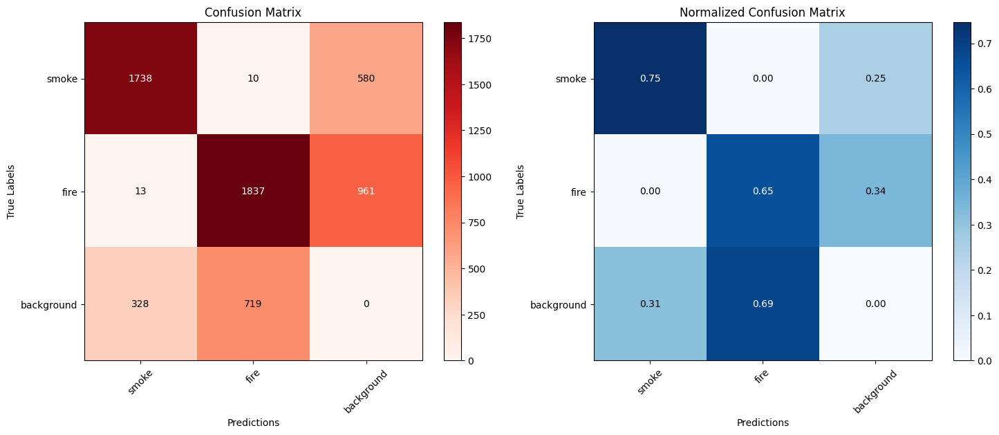

In [ ]:
# Load the model
model = YOLO(r'C:\Users\eduar\Documents\florest_fire_env\florest_fire_env\fire_model4\weights\best.pt')  # Use the trained weights file

# Perform validation with the default dataset (defined in the YAML used in training)
metrics = model.val()

# Perform validation with a new set of data
metrics = model.val(data='data.yaml')

conf_matrix = metrics.confusion_matrix

# Get the confusion matrix
conf_matrix_values = conf_matrix.matrix  # It is already a NumPy array

# Normalizing the confusion matrix (dividing each row by the sum of the rows)
conf_matrix_normalized = conf_matrix_values.astype('float') / conf_matrix_values.sum(axis=1)[:, np.newaxis]

# Class names
class_names = ["smoke", "fire", "background"] 

# Plotting matrices side by side
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# Plotting the original confusion matrix
cax1 = axes[0].imshow(conf_matrix_values, interpolation='nearest', cmap=plt.cm.Reds)
axes[0].set_title('Confusion Matrix')
axes[0].set_xlabel('Predictions')
axes[0].set_ylabel('True Labels')
axes[0].set_xticks(np.arange(len(class_names)))
axes[0].set_yticks(np.arange(len(class_names)))
axes[0].set_xticklabels(class_names, rotation=45)
axes[0].set_yticklabels(class_names)

# Adding values ​​to the cells of the original matrix
thresh = conf_matrix_values.max() / 2.0
for i, j in np.ndindex(conf_matrix_values.shape):
    axes[0].text(j, i, format(conf_matrix_values[i, j], '.0f'),
                 ha="center", va="center",
                 color="white" if conf_matrix_values[i, j] > thresh else "black")

# Add the color bar to the original matrix
fig.colorbar(cax1, ax=axes[0])

# Plotting the normalized confusion matrix
cax2 = axes[1].imshow(conf_matrix_normalized, interpolation='nearest', cmap=plt.cm.Blues)
axes[1].set_title('Normalized Confusion Matrix')
axes[1].set_xlabel('Predictions')
axes[1].set_ylabel('True Labels')
axes[1].set_xticks(np.arange(len(class_names)))
axes[1].set_yticks(np.arange(len(class_names)))
axes[1].set_xticklabels(class_names, rotation=45)
axes[1].set_yticklabels(class_names)

# Adding values ​​to cells of the normalized matrix
thresh_norm = conf_matrix_normalized.max() / 2.0
for i, j in np.ndindex(conf_matrix_normalized.shape):
    axes[1].text(j, i, format(conf_matrix_normalized[i, j], '.2f'),
                 ha="center", va="center",
                 color="white" if conf_matrix_normalized[i, j] > thresh_norm else "black")

# Add the color bar to the normalized matrix
fig.colorbar(cax2, ax=axes[1])

# Display the graph
plt.tight_layout()
plt.show()


The graphs above show the confusion matrix (left) and normalized confusion matrix (right) for a classification model. Let's analyze the results and discuss the main points:

1. **General Analysis of the Confusion Matrix:**<p>

- Class `smoke`:<p>

    - Most examples of this class were correctly classified (1,738 correct predictions).<p>
    - Only 10 examples were incorrectly classified as `fire`.<p>
    - There were a significant number of confusions with the `background` class (580 incorrect predictions).<p>

- Class `fire`:<p>

    - The model performed well in this class, with 1,837 correct classifications.<p>
    - Few mistakes were made, such as 13 confusions with `smoke`.<p>
    - However, 961 examples were confused with "background".<p> 

- Class `background`:<p>

Relatively poor performance in this class, with only 719 correct classifications. There were 328 confusions with `smoke` and 719 confusions with `fire`. Indicating that the model signals signs of fire where there are none. 

2. **Normalized Matrix Insights:**<p>

- Normalization reveals the proportional performance of the model by class:<p>
    - `smoke` class: High hit rate (75%), but still with 25% of confusions with `background`.<p>
    - `fire` class: Moderate hits (65%), but a significant number of errors with `background` (34%).<p>
    - `background` class: Most problematic result: only 69% correct, with a high rate of confusion with `smoke` (31%).<p>


3. **Conclusion:**<p> 
Based on these results:

- The current performance of the model may be insufficient for practical use in fire monitoring, where it is crucial:<p>

- Minimize false negatives in `smoke` and `fire`.<p>

- Reduce background false positives to avoid unnecessary alarms.<p>

- If the goal is a prototype or early stage of development, the model is a good starting point, but still needs improvements.<p>   



Showing some model prediction images during the validation phase:

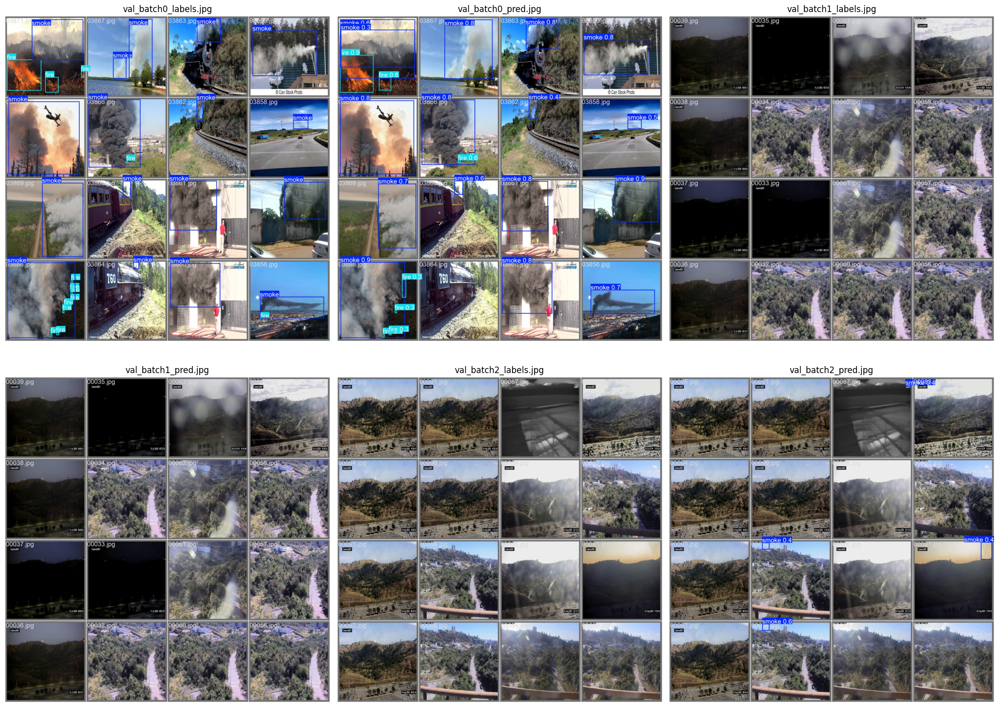

In [ ]:
# Function to display images side by side
def plot_images_side_by_side(image_paths):
    # Upload images
    images = [Image.open(img_path) for img_path in image_paths]
    
    # Create a figure with 2 rows and 3 columns (for each pair of images)
    fig, axes = plt.subplots(2, 3, figsize=(20, 15))  # Increase size as needed

    # Adjust so that axis is a list of axes (flatten)
    axes = axes.flatten()

   # Plot each pair of images
    for i, (ax, img, path) in enumerate(zip(axes, images, image_paths)):
        ax.imshow(img)
        ax.axis('off') # Disable axes for a cleaner view
        ax.set_title(path.split("\\")[-1])  # Set title to image name

    plt.tight_layout()
    plt.show()

# Image paths
image_paths = [
    r"C:\Users\eduar\Documents\florest_fire_env\val_batch0_labels.jpg",
    r"C:\Users\eduar\Documents\florest_fire_env\val_batch0_pred.jpg",
    r"C:\Users\eduar\Documents\florest_fire_env\val_batch1_labels.jpg",
    r"C:\Users\eduar\Documents\florest_fire_env\val_batch1_pred.jpg",
    r"C:\Users\eduar\Documents\florest_fire_env\val_batch2_labels.jpg",
    r"C:\Users\eduar\Documents\florest_fire_env\val_batch2_pred.jpg"
]

# Call the function to display the images side by side
plot_images_side_by_side(image_paths)


In [ ]:
# Load the dataset
data_results = pd.read_csv(r"C:\Users\eduar\Documents\florest_fire_env\results.csv")

# Function to generate the graph with subplots
def plot_training_metrics(data_results):
    # Setting the number of subplots (4x2) to have more space for individual variables
    num_rows = 4  
    num_cols = 2 
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 8))
    
    # Ensure that axes is a 4x2 matrix
    axes = axes.flatten()

    # Plotting 'train/box_loss' and 'val/box_loss' on the same graph
    ax = axes[0]
    ax.plot(data_results['epoch'], data_results['train/box_loss'], label='train/box_loss')
    ax.plot(data_results['epoch'], data_results['val/box_loss'], label='val/box_loss')
    ax.set_xlabel('Epochs')
    ax.set_ylabel('Loss')
    ax.set_title('Box Loss vs Epochs')
    ax.legend()

    # Plotting 'train/dfl_loss' and 'val/dfl_loss' on the same graph
    ax = axes[1]
    ax.plot(data_results['epoch'], data_results['train/dfl_loss'], label='train/dfl_loss')
    ax.plot(data_results['epoch'], data_results['val/dfl_loss'], label='val/dfl_loss')
    ax.set_xlabel('Epochs')
    ax.set_ylabel('Loss')
    ax.set_title('DFL Loss vs Epochs')
    ax.legend()

    # Plotting 'train/cls_loss' and 'val/cls_loss' on the same graph
    ax = axes[2]
    ax.plot(data_results['epoch'], data_results['train/cls_loss'], label='train/cls_loss')
    ax.plot(data_results['epoch'], data_results['val/cls_loss'], label='val/cls_loss')
    ax.set_xlabel('Epochs')
    ax.set_ylabel('Loss')
    ax.set_title('Classification Loss vs Epochs')
    ax.legend()

    # List of other columns to plot individually
    columns_individual = [
        'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)'
    ]
    
    # Plotting the remaining variables (individually)
    for i, col in enumerate(columns_individual):
        ax = axes[i + 3]  # Starting from the 4th graph
        ax.plot(data_results['epoch'], data_results[col], label=col)
        ax.set_xlabel('Epochs')
        ax.set_ylabel(col)
        ax.set_title(f'{col} vs Epochs')
        ax.legend()

    # Adjust the layout so that the graphics do not overlap
    plt.tight_layout()
    plt.show()



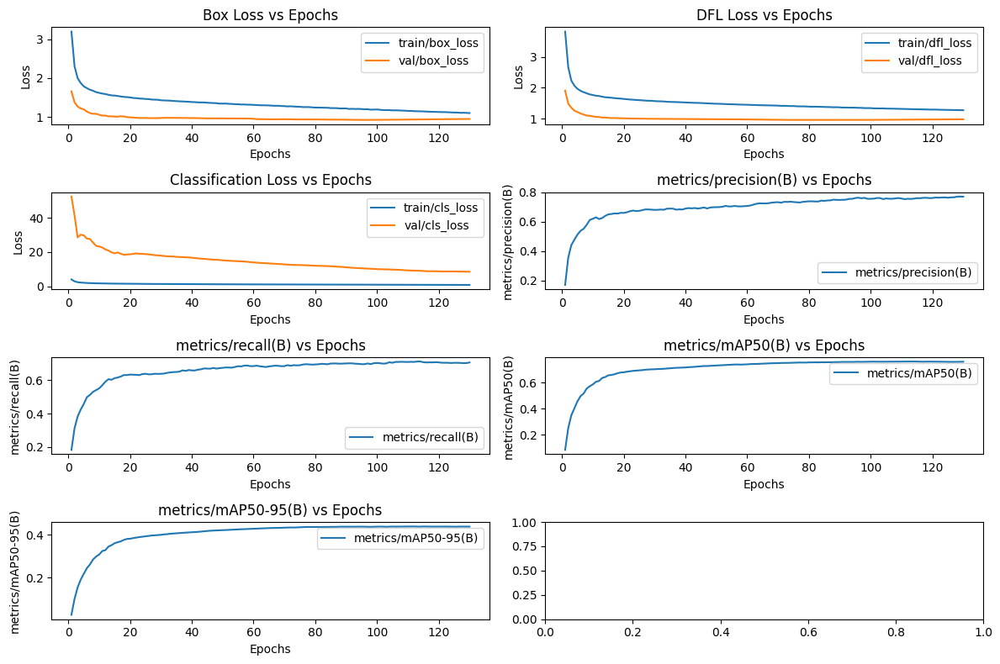

In [ ]:
# Call the function to generate the graphs
plot_training_metrics(data_results)

Based on the graph presented, we can discuss the performance of the model considering the different metrics and losses presented:

1. **Box Loss vs Epochs**<p>
- Description: Measures the error related to the predictions of the bounding boxes.<p>

- Note: For both the training and validation sets, the error decreases consistently, stabilizing after about 100 epochs. The difference between the training and validation curves is small, indicating good fit and low risk of overfitting.<p>

2. **DFL Loss vs Epochs**<p>

- Description: Refers to "Distribution Focal Loss", which evaluates the accuracy of the distribution of bounding box predictions.<p>

- Note: Similar to Box Loss, the training and validation curve decreases consistently and stabilizes, suggesting that the model demonstrated efficient learning.<p>

3. **Classification Loss vs Epochs** <p>

- Description: Measures the error in classifying categories (background, smoke, fire).<p>

- Note: The training curve is very low from the beginning, while validation starts high and gradually decreases. This initial discrepancy may indicate differences in the validation set or a possible adjustment of the model throughout training. The stabilized behavior after 100 epochs is a positive point.<p>

4. **Precision (B) vs Epochs**<p>

- Description: Measures the proportion of correct predictions in relation to the total number of predictions made by the model.<p>

- Note: Accuracy increases significantly in the first 20 epochs and stabilizes at a value close to 0.75 (75% accuracy).<p>

- Consideration: May be sufficient for applications where false positives are tolerable. However, in critical systems, this value can be improved by tweaking the data or hyperparameters.<p>

5. **Recall (B) vs Epochs**<p>
- Description: Measures the proportion of correct predictions in relation to the total number of actual occurrences in the data set.<p>
- Note: The recall stabilizes around 0.60 (60%), which can be worrying in cases where detection is a priority.<p>
- Consideration: Low recall means false negatives, that is, the model is failing to identify cases of smoke or fire. It is a critical point that can be adjusted by: Adding more examples of `smoke` and `fire`. Balance the weight of classes in training.<p>

6. **mAP50(B) vs Epochs** <p>
- Description: Mean Average Precision (IoU ≥ 50%), a metric to evaluate the average precision considering different classes.<p>
- Note: The metric stabilizes around 0.65 (65%), indicating reasonable performance for detection.<p>
- Consideration: Although the value is not bad, it may be insufficient in highly demanding applications such as fire monitoring.<p>

7. **mAP50-95(B) vs Epochs**<p>
- Description: Average accuracy at different IoU thresholds (50% to 95%).<P>
- Note: Stabilizes around 0.50 (50%), a relatively low value for a robust detection model.<P>
- Consideration: Indicates that the model may not be generalizing well to different sizes or positions of the bounding boxes.<P>

General Points:
**Overfitting:**<p>

- Training and validation losses are consistent, suggesting low overfitting.<p>
- However, the difference in validation metrics (recall, mAP) shows room for improvement.<p>

**Overall Performance:**<p>

- Precision is good (75%), but relatively low recall (60%) is concerning for critical applications.<p>

**Suggested actions:**<p>

- Improve smoke and fire detection with:
- Balancing the dataset (e.g. increasing examples of minority classes). Adjustments to the detection threshold to prioritize recall (if false positives are acceptable).<p>

- Future iterations: Evaluate model error cases (false positives and negatives) to identify recurring patterns and adjust the pipeline.

## **Predictions**<p>
Finally, some YouTube videos will be used to make predictions with the model and illustrate its performance in a detection task.

In [ ]:
# Load the trained model
model = YOLO(r'C:\Users\eduar\Documents\florest_fire_env\florest_fire_env\fire_model4\weights\best.pt')

# Make prediction on a video
results = model.predict(
    source=r"C:\Users\eduar\Documents\florest_fire_env\Videos\Anatomy of a burnover_ RoundMtn Paskenta camera enveloped in flames....mp4",  # Substitua pelo caminho do vídeo
    save=True,  
    save_txt=True,
    project="runs/videos",  # Nome do projeto
    name="fire_predictions_5", 
    conf=0.48,
    iou=0.5,
    device=0
)



WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/3598) C:\Users\eduar\Documents\florest_fire_env\Videos\Anatomy of a burnover_ RoundMtn Paskenta camera enveloped in flames....mp4: 384x640 1 smoke, 24.8ms
video 1/1 (frame 2/3598) C:\Users\eduar\Documents\florest_fire_env\Videos\Anatomy of a burnover_ RoundMtn Paskenta camera enveloped in flames....mp4: 384x640 1 smoke, 34.6ms
video 1/1 (frame 3/3598) C:\Users\eduar\Documents\florest_fire_env\Videos\Anatomy of a burnover_ RoundMtn Pask